<a href="https://colab.research.google.com/github/Nikhil5566/Data-Science-Portfolio-Projects/blob/main/Silver%2C_Gold_%26_Platinum_Price_Forecasting_Dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Silver, Gold & Platinum Price Forecasting

# Dataset & Key Insights

### **Dataset Overview: The Pulse of the Market**
We have analyzed a robust time-series dataset spanning over a decade, combining historical daily closing prices for **Gold**, **Silver**, and **Platinum** with future forecast data up to 2026. This dataset captures more than just raw value; through feature engineering, we unlocked layers of market sentiment, tracking **volatility** (risk), **moving averages** (trends), and **inter-market relationships** (the Gold-Silver ratio).

### **Key Insights: Market Physics & Relationships**
Our statistical deep dive revealed three critical "personalities" of these assets:

1.  **The Leader-Follower Dynamic**: One of the most actionable insights came from our **Granger Causality** test. We found a statistically significant relationship where **Gold leads Silver**. Changes in the price of Gold today are a strong predictor of how Silver will move tomorrow. This confirms Gold's status as the primary sentiment driver in the precious metals sector.

2.  **The "Drifting Friends" Phenomenon**: Despite their reputation as a pair, our analysis showed that Gold and Silver are **not cointegrated** (P-Value > 0.05). In plain English, this means that while they act like friends who often walk in the same direction, they are not holding hands. There is no mathematical "rubber band" forcing them back to a specific price ratio in the long run. Traders relying on mean-reversion strategies for the Gold-Silver pair should be cautious, as the two metals can drift apart significantly without snapping back.

3.  **The Trend Trap**: We confirmed that raw prices are **non-stationary**, meaning they follow unpredictable trends rather than fluctuating around a set average. This explains why our initial AI model struggled; it's like trying to predict where a wandering traveler will go next based only on where they stood yesterday.

### **The AI's Verdict: A Highly Efficient Market**
Our Machine Learning experiment (Random Forest) highlighted a fundamental truth of financial markets: **Efficiency**.

When we tasked the AI with predicting the *exact* daily return of Gold using only past technical data, it achieved a slightly negative R-Squared score. This doesn't mean the model is "broken"; rather, it indicates that the market is "efficient." Past price patterns alone are not enough to consistently predict the future profit or loss of a commodity. The price of Gold tomorrow is likely driven by external factors—geopolitical news, interest rates, or inflation reports—that are not present in a simple price-history dataset.

### **Strategic Takeaway**
For an analyst or investor, this dataset paints a picture of a market that is interconnected yet independent. **Gold is the signal, Silver is the echo.** While historical patterns provide context (volatility regimes), they are not a crystal ball. Success in this market likely comes from managing risk (volatility) rather than trying to perfectly time the daily price movements.

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Installing Kaggle API
!pip install -q kaggle

# Uploading kaggle.json
from google.colab import files
files.upload()

# Moving kaggle.json to ~/.kaggle/
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

# Downloading the dataset using Kaggle API
!kaggle datasets download -d ashrafkhetran/silver-gold-and-platinum-price-forecasting

# Unziping the downloaded file
!unzip silver-gold-and-platinum-price-forecasting.zip

Saving kaggle.json to kaggle.json
Dataset URL: https://www.kaggle.com/datasets/ashrafkhetran/silver-gold-and-platinum-price-forecasting
License(s): Attribution 4.0 International (CC BY 4.0)
  0% 0.00/269k [00:00<?, ?B/s]
100% 269k/269k [00:00<00:00, 168MB/s]
Archive:  silver-gold-and-platinum-price-forecasting.zip
  inflating: precious_metals_forecast_to_march2026.csv  
  inflating: precious_metals_historical_data.csv  


# Data Inspection

In [34]:
# Loading datasets
df_forecast = pd.read_csv('precious_metals_forecast_to_march2026.csv')
df_historical = pd.read_csv('precious_metals_historical_data.csv')

df_forecast = df_forecast.rename(columns={
    'Forecast_Date': 'Date',
    'Silver': 'Silver_Price',
    'Gold': 'Gold_Price',
    'Platinum': 'Platinum_Price'
})

df = pd.concat([df_historical, df_forecast], ignore_index=True, sort=False)

# 3. Handling Date format
df['Date'] = pd.to_datetime(df['Date'])
df = df.sort_values('Date').reset_index(drop=True)

df.head(11)

,Date,Silver_Price,Gold_Price,Platinum_Price,Silver_Returns,Gold_Returns,Platinum_Returns,Gold_Silver_Ratio,Silver_Volatility_30d,Gold_Volatility_30d,Platinum_Volatility_30d,Silver_MA50,Silver_MA200,Gold_MA50,Gold_MA200
0,2016-02-03,13.95,109.250000,84.940002,NaN,NaN,NaN,7.831541,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2016-02-04,14.17,110.570000,87.260002,0.015771,0.012082,0.027313,7.803105,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2016-02-05,14.34,112.320000,87.919998,0.011997,0.015827,0.007564,7.832636,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2016-02-08,14.59,113.830002,89.199997,0.017434,0.013444,0.014559,7.801919,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2016-02-09,14.51,113.580002,89.849998,-0.005483,-0.002196,0.007287,7.827705,NaN,NaN,NaN,NaN,NaN,NaN,NaN
5,2016-02-10,14.55,114.459999,90.190002,0.002757,0.007748,0.003784,7.866667,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,2016-02-11,14.95,119.059998,92.540001,0.027491,0.040189,0.026056,7.963880,NaN,NaN,NaN,NaN,NaN,NaN,NaN
7,2016-02-12,14.99,118.360001,92.150002,0.002676,-0.005879,-0.004214,7.895931,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8,2016-02-16,14.51,114.769997,89.750000,-0.032021,-0.030331,-0.026045,7.909717,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,2016-02-17,14.54,115.480003,90.860001,0.002068,0.006186,0.012368,7.942229,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [32]:
df.tail(11)

,Date,Silver_Price,Gold_Price,Platinum_Price,Silver_Returns,Gold_Returns,Platinum_Returns,Gold_Silver_Ratio,Silver_Volatility_30d,Gold_Volatility_30d,Platinum_Volatility_30d,Silver_MA50,Silver_MA200,Gold_MA50,Gold_MA200
2511,2026-01-29,105.570000,495.899994,239.130005,-0.000284,0.002709,-0.024596,4.697357,0.652147,0.249122,0.761256,66.186600,43.640800,408.279401,346.68100
2512,2026-01-30,89.709900,465.019989,206.464996,-0.150233,-0.062271,-0.136599,5.183597,0.816880,0.320855,0.875470,67.071398,43.942449,410.146801,347.52495
2513,2026-02-08,90.920017,469.126537,208.800413,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2514,2026-02-15,92.130134,473.233084,211.135829,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2515,2026-02-22,93.340251,477.339632,213.471246,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2516,2026-03-01,94.550368,481.446180,215.806663,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2517,2026-03-08,95.760485,485.552727,218.142079,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2518,2026-03-15,96.970602,489.659275,220.477496,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2519,2026-03-22,98.180719,493.765823,222.812912,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2520,2026-03-29,99.390837,497.872370,225.148329,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [33]:
df.shape

(2522, 15)

In [36]:
df.columns

Index(['Date', 'Silver_Price', 'Gold_Price', 'Platinum_Price',
       'Silver_Returns', 'Gold_Returns', 'Platinum_Returns',
       'Gold_Silver_Ratio', 'Silver_Volatility_30d', 'Gold_Volatility_30d',
       'Platinum_Volatility_30d', 'Silver_MA50', 'Silver_MA200', 'Gold_MA50',
       'Gold_MA200'],
      dtype='object')

In [35]:
df.dtypes

,0
Date,datetime64[ns]
Silver_Price,float64
Gold_Price,float64
Platinum_Price,float64
Silver_Returns,float64
Gold_Returns,float64
Platinum_Returns,float64
Gold_Silver_Ratio,float64
Silver_Volatility_30d,float64
Gold_Volatility_30d,float64


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 2522 entries, 0 to 2512
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Forecast_Date            9 non-null      object 
 1   Silver                   9 non-null      float64
 2   Gold                     9 non-null      float64
 3   Platinum                 9 non-null      float64
 4   Date                     2513 non-null   object 
 5   Silver_Price             2513 non-null   float64
 6   Gold_Price               2513 non-null   float64
 7   Platinum_Price           2513 non-null   float64
 8   Silver_Returns           2512 non-null   float64
 9   Gold_Returns             2512 non-null   float64
 10  Platinum_Returns         2512 non-null   float64
 11  Gold_Silver_Ratio        2513 non-null   float64
 12  Silver_Volatility_30d    2483 non-null   float64
 13  Gold_Volatility_30d      2483 non-null   float64
 14  Platinum_Volatility_30d  2483

In [37]:
df.describe(include = 'all').T

,count,mean,min,25%,50%,75%,max,std
Date,2522,2021-02-04 19:52:46.058683392,2016-02-03 00:00:00,2018-08-03 18:00:00,2021-02-04 12:00:00,2023-08-08 18:00:00,2026-04-05 00:00:00,NaN
Silver_Price,2522.0,21.694563,11.21,15.92,19.889999,23.639999,105.599998,10.148524
Gold_Price,2522.0,175.008711,107.339996,123.6875,165.340004,183.647495,499.514989,67.071254
Platinum_Price,2522.0,93.519244,55.360001,84.309998,89.420002,95.337498,252.25,20.21469
Silver_Returns,2512.0,0.000905,-0.150233,-0.007996,0.000716,0.009338,0.091429,0.018044
Gold_Returns,2512.0,0.000622,-0.064269,-0.00446,0.00072,0.005523,0.049038,0.009496
Platinum_Returns,2512.0,0.000507,-0.136599,-0.00942,0.000439,0.009601,0.110372,0.017444
Gold_Silver_Ratio,2513.0,8.198247,4.683333,7.615631,8.183206,8.704824,12.551293,0.92101
Silver_Volatility_30d,2483.0,0.256662,0.11076,0.184876,0.237276,0.294129,0.81688,0.106426
Gold_Volatility_30d,2483.0,0.139474,0.064632,0.105537,0.132642,0.159719,0.357717,0.048793


In [38]:
df.isnull().sum()

,0
Date,0
Silver_Price,0
Gold_Price,0
Platinum_Price,0
Silver_Returns,10
Gold_Returns,10
Platinum_Returns,10
Gold_Silver_Ratio,9
Silver_Volatility_30d,39
Gold_Volatility_30d,39


In [30]:
# Check for missing values after alignment
# We no longer drop columns since we renamed them correctly.
print("Data Shape:", df.shape)
print("\nMissing Values:")
print(df.isnull().sum())

Data Shape: (2522, 15)

Missing Values:
Date                         0
Silver_Price                 0
Gold_Price                   0
Platinum_Price               0
Silver_Returns              10
Gold_Returns                10
Platinum_Returns            10
Gold_Silver_Ratio            9
Silver_Volatility_30d       39
Gold_Volatility_30d         39
Platinum_Volatility_30d     39
Silver_MA50                 58
Silver_MA200               208
Gold_MA50                   58
Gold_MA200                 208
dtype: int64


# Handling Outliers

In [14]:
# Identifying numerical and categorical columns
numerical_cols = df.select_dtypes(include=np.number).columns
categorical_cols = df.select_dtypes(include='object').columns

# For numerical columns, we might impute with the mean or median
for col in numerical_cols:
    if df[col].isnull().any():
        df[col].fillna(df[col].mean(), inplace=True)

# For categorical columns, we might impute with the mode or a constant
for col in categorical_cols:
    if df[col].isnull().any():
        df[col].fillna(df[col].mode()[0], inplace=True)

print("\nMissing values after handling:")
df.isnull().sum()


Missing values after handling:


,0
Date,0
Silver_Price,0
Gold_Price,0
Platinum_Price,0
Silver_Returns,0
Gold_Returns,0
Platinum_Returns,0
Gold_Silver_Ratio,0
Silver_Volatility_30d,0
Gold_Volatility_30d,0


# Univariate Analysis

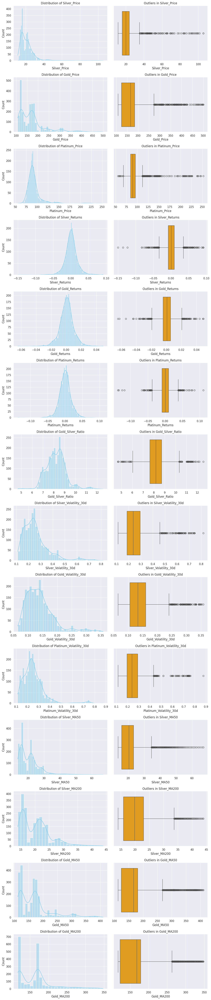

In [39]:
import math

# --- 1. Numerical Analysis (Histograms + Box Plots) ---
# Filter out ID columns for better visualization
numeric_cols = df.select_dtypes(include=np.number).columns.tolist()
# Remove 'country_code' if present as it's just an ID
cols_to_plot = [c for c in numeric_cols if 'code' not in c.lower()]

if len(cols_to_plot) > 0:
    num_plots = len(cols_to_plot)
    # We will create 2 plots per variable: Histogram and Boxplot
    fig, axes = plt.subplots(num_plots, 2, figsize=(12, 4 * num_plots))

    for i, col in enumerate(cols_to_plot):
        # Histogram
        sns.histplot(data=df, x=col, kde=True, ax=axes[i, 0], color='skyblue')
        axes[i, 0].set_title(f'Distribution of {col}')

        # Boxplot
        sns.boxplot(data=df, x=col, ax=axes[i, 1], color='orange')
        axes[i, 1].set_title(f'Outliers in {col}')

    plt.tight_layout()
    plt.show()
else:
    print("No numerical columns to plot.")

# --- 2. Categorical Analysis ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()

if len(categorical_cols) > 0:
    num_plots = len(categorical_cols)
    num_cols = 2 # 2 columns is usually better for categorical text labels
    num_rows = math.ceil(num_plots / num_cols)

    fig, axes = plt.subplots(num_rows, num_cols, figsize=(14, 5 * num_rows))
    axes = axes.flatten()

    for i, col in enumerate(categorical_cols):
        # Get top 10 categories to avoid clutter
        top_cats = df[col].value_counts().head(10).index
        sns.countplot(data=df[df[col].isin(top_cats)], x=col, ax=axes[i], order=top_cats, palette='viridis')
        axes[i].set_title(f'Top 10 Categories in {col}')
        axes[i].tick_params(axis='x', rotation=45)

    # Hide unused
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()

# Bivariarte Analysis

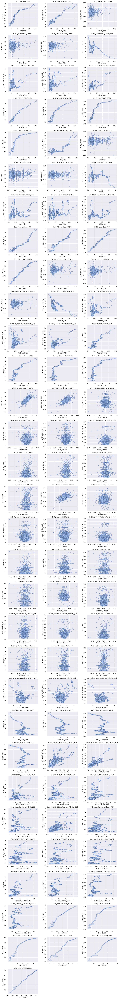

No categorical-numerical pairs found.


In [40]:
import itertools

# --- 1. Numerical-Numerical Relationships (Scatter Plots) ---
numerical_cols = df.select_dtypes(include=np.number).columns.tolist()

# Generate all unique pairs of numerical columns
num_pairs = list(itertools.combinations(numerical_cols, 2))

if len(num_pairs) > 0:
    num_plots = len(num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))

    # Ensure axes is always a 1D array of Axes objects for consistent iteration
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (col1, col2) in enumerate(num_pairs):
        if i < len(axes):
            sns.scatterplot(data=df, x=col1, y=col2, ax=axes[i], alpha=0.5)
            axes[i].set_title(f'{col1} vs {col2}')
            axes[i].set_xlabel(col1)
            axes[i].set_ylabel(col2)
        else:
            break

    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("Not enough numerical columns for scatter plots.")


# --- 2. Categorical-Numerical Relationships (Box Plots) ---
categorical_cols = df.select_dtypes(include='object').columns.tolist()
cat_num_pairs = list(itertools.product(categorical_cols, numerical_cols))

if len(cat_num_pairs) > 0:
    num_plots = len(cat_num_pairs)
    num_cols = 3
    num_rows = math.ceil(num_plots / num_cols)
    fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows))
    if not isinstance(axes, np.ndarray):
        axes = np.array([axes])
    else:
        axes = axes.flatten()

    # Iterating through pairs and plot
    for i, (cat_col, num_col) in enumerate(cat_num_pairs):
        if i < len(axes):
            # 1. Getting top 10 categories based on frequency
            top_categories = df[cat_col].value_counts().nlargest(10).index.tolist()

            # 2. Filtering data: Keep only top categories AND ensure numerical column is not NaN
            filtered_df = df[df[cat_col].isin(top_categories) & df[num_col].notnull()]

            # This prevents the ValueError where a category in 'order' has no data to plot
            valid_categories = [cat for cat in top_categories if cat in filtered_df[cat_col].unique()]

            if valid_categories:
                sns.boxplot(data=filtered_df, x=cat_col, y=num_col, ax=axes[i], order=valid_categories)
                axes[i].set_title(f'{num_col} by {cat_col} (Top 10)')
                axes[i].set_xlabel(cat_col)
                axes[i].set_ylabel(num_col)
                axes[i].tick_params(axis='x', rotation=45)
            else:
                 axes[i].text(0.5, 0.5, "No valid data", ha='center', va='center', transform=axes[i].transAxes)
        else:
            break

    # Hiding unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].axis('off')

    plt.tight_layout()
    plt.show()
else:
    print("No categorical-numerical pairs found.")

# Multivariate Analysis

--- Multivariate Scatter Plots (Color = Year) ---


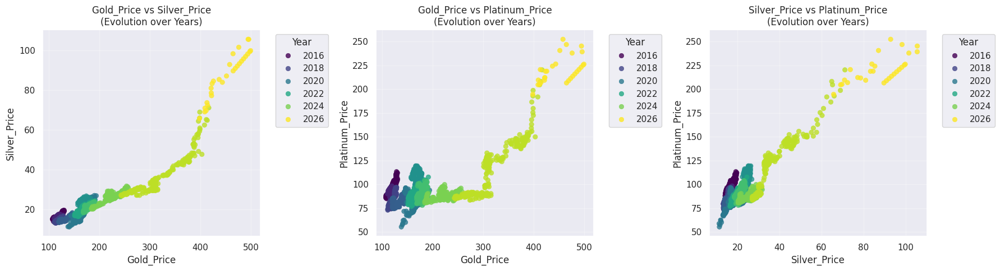

In [41]:
import itertools
import matplotlib.pyplot as plt
import seaborn as sns

# 1. Prepare Data for Multivariate Plotting
# Extract Year to use as the 3rd dimension (Color/Hue)
if 'Date' in df.columns:
    df['Year'] = df['Date'].dt.year
else:
    print("Date column missing, using index for year approximation if possible.")
    df['Year'] = df.index.year if hasattr(df.index, 'year') else range(len(df))

# Define the variables to analyze
metals = ['Gold_Price', 'Silver_Price', 'Platinum_Price']

# Generate all unique pairs of metals
metal_pairs = list(itertools.combinations(metals, 2))

print("--- Multivariate Scatter Plots (Color = Year) ---")
plt.figure(figsize=(18, 5))

# Loop through each pair and plot
for i, (col_x, col_y) in enumerate(metal_pairs):
    plt.subplot(1, 3, i + 1)

    # Plot: X vs Y, colored by Year
    sns.scatterplot(
        data=df,
        x=col_x,
        y=col_y,
        hue='Year',
        palette='viridis',
        alpha=0.8,
        edgecolor=None
    )

    plt.title(f'{col_x} vs {col_y}\n(Evolution over Years)')
    plt.grid(True, alpha=0.3)

    # Simplify legend
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', title='Year')

plt.tight_layout()
plt.show()

# Statistical Analysis

In [23]:
from statsmodels.tsa.stattools import adfuller, coint, grangercausalitytests

print("--- 1. STATIONARITY TEST (AUGMENTED DICKEY-FULLER) ---")

def check_stationarity(series, name):
    result = adfuller(series.dropna())
    p_value = result[1]
    print(f"Testing {name}:")
    print(f"   P-Value: {p_value:.4f}")
    if p_value < 0.05:
        print("   ✅ Result: Stationary (Safe for ML)")
    else:
        print("   ❌ Result: Non-Stationary (Has a Trend - Use Returns instead)")
    print("-" * 30)

if 'Gold_Price' in df.columns:
    check_stationarity(df['Gold_Price'], "Gold Raw Price")
if 'Gold_Return' not in df.columns:
    df['Gold_Return'] = df['Gold_Price'].pct_change()

check_stationarity(df['Gold_Return'], "Gold Daily Returns")


print("\n--- 2. COINTEGRATION TEST (PAIRS TRADING) ---")
if 'Gold_Price' in df.columns and 'Silver_Price' in df.columns:
    coint_data = df[['Gold_Price', 'Silver_Price']].dropna()
    score, p_value, _ = coint(coint_data['Gold_Price'], coint_data['Silver_Price'])

    print(f"Cointegration P-Value: {p_value:.4f}")
    if p_value < 0.05:
        print("✅ Result: Gold & Silver are COINTEGRATED. (Mean Reversion Strategy is valid)")
    else:
        print("❌ Result: They drift apart randomly. (Be careful with Ratio strategies)")
else:
    print("Skipping Cointegration: Gold_Price or Silver_Price column missing.")


print("\n--- 3. WHO LEADS THE MARKET? (GRANGER CAUSALITY) ---")

if 'Gold_Return' in df.columns and 'Silver_Return' in df.columns:
    print("Checking: Does GOLD prediction SILVER?")
    gc_data = df[['Silver_Return', 'Gold_Return']].dropna()
    gc_res = grangercausalitytests(gc_data, maxlag=5, verbose=False)
    p_val_lag1 = gc_res[1][0]['ssr_chi2test'][1]
    print(f"\nDoes Gold cause Silver? (Lag 1 Day)")
    print(f"P-Value: {p_val_lag1:.4f}")
    if p_val_lag1 < 0.05:
        print("✅ YES: Gold movements predict Silver prices tomorrow.")
    else:
        print("❌ NO: Gold does not reliably lead Silver.")

--- 1. STATIONARITY TEST (AUGMENTED DICKEY-FULLER) ---
Testing Gold Raw Price:
   P-Value: 1.0000
   ❌ Result: Non-Stationary (Has a Trend - Use Returns instead)
------------------------------
Testing Gold Daily Returns:
   P-Value: 0.0000
   ✅ Result: Stationary (Safe for ML)
------------------------------

--- 2. COINTEGRATION TEST (PAIRS TRADING) ---
Cointegration P-Value: 0.3420
❌ Result: They drift apart randomly. (Be careful with Ratio strategies)

--- 3. WHO LEADS THE MARKET? (GRANGER CAUSALITY) ---
Checking: Does GOLD prediction SILVER?

Does Gold cause Silver? (Lag 1 Day)
P-Value: 0.0000
✅ YES: Gold movements predict Silver prices tomorrow.


## Time Series Decomposition




--- Decomposing Gold_Price ---


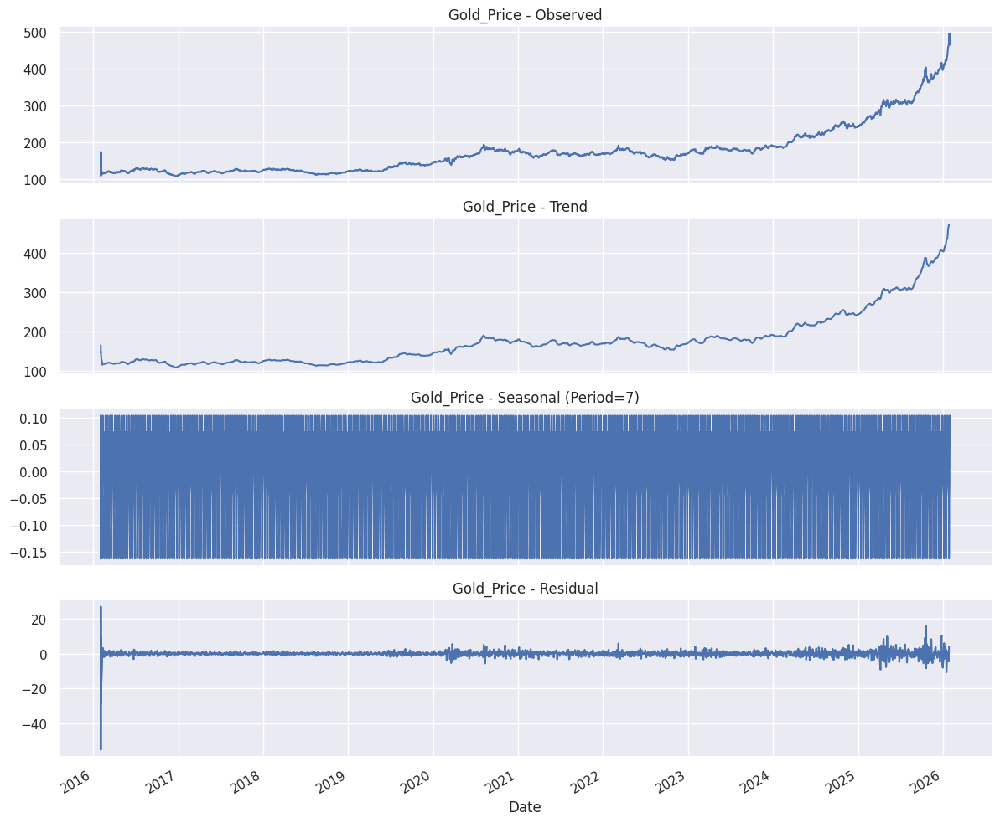


--- Decomposing Silver_Price ---


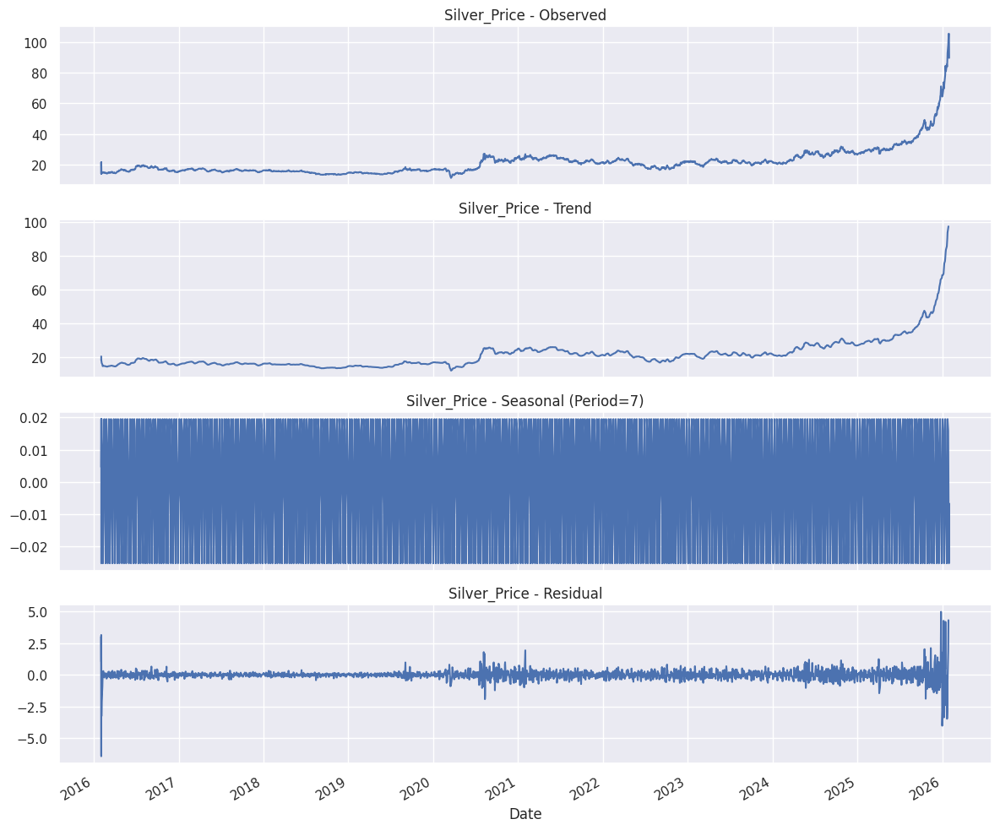


--- Decomposing Platinum_Price ---


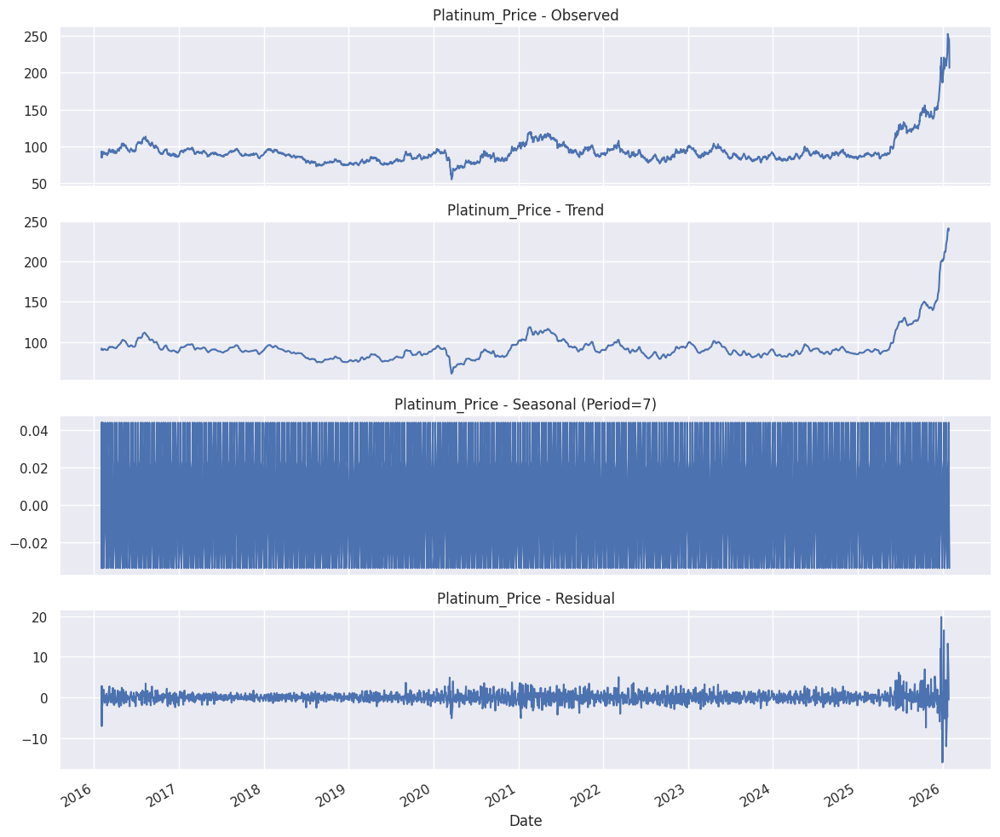

In [24]:
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt

df['Date'] = pd.to_datetime(df['Date'])
df = df.set_index('Date').sort_index()

price_cols = ['Gold_Price', 'Silver_Price', 'Platinum_Price']
period = 7

for col in price_cols:
    print(f"\n--- Decomposing {col} ---")
    if len(df[col].dropna()) < 2 * period:
        print(f"Skipping decomposition for {col}: Not enough data points for period={period}")
        continue

    series_to_decompose = df[col].dropna()
    if not series_to_decompose.empty:
        try:
            result = seasonal_decompose(series_to_decompose, model='additive', period=period)

            fig, (ax1, ax2, ax3, ax4) = plt.subplots(4, 1, figsize=(12, 10), sharex=True)
            result.observed.plot(ax=ax1, title=f'{col} - Observed')
            result.trend.plot(ax=ax2, title=f'{col} - Trend')
            result.seasonal.plot(ax=ax3, title=f'{col} - Seasonal (Period={period})')
            result.resid.plot(ax=ax4, title=f'{col} - Residual')
            plt.tight_layout()
            plt.show()
        except Exception as e:
            print(f"Error decomposing {col}: {e}")
    else:
        print(f"Series {col} is empty after dropping NaNs, skipping decomposition.")

## Autocorrelation Analysis


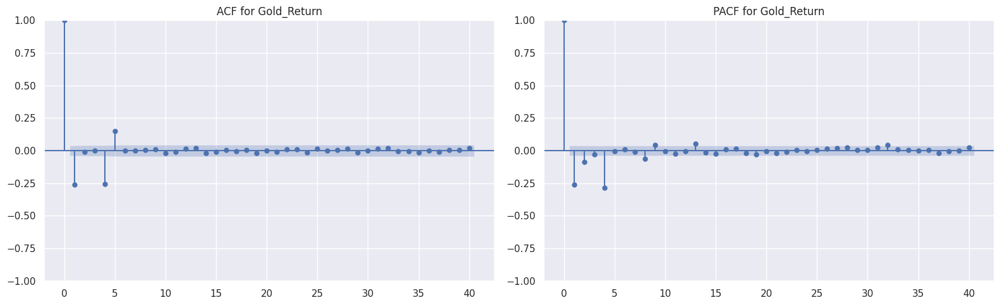

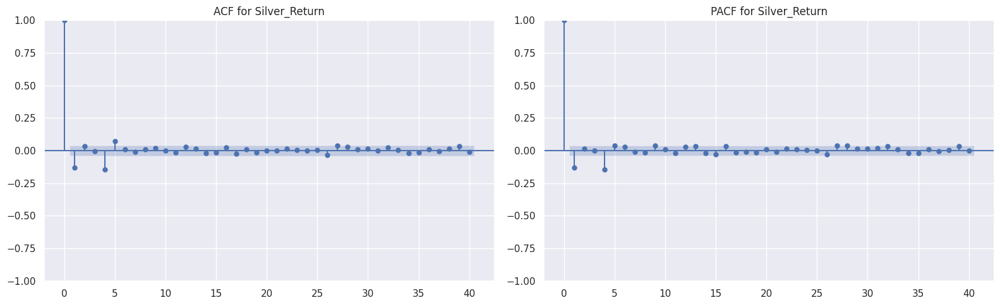

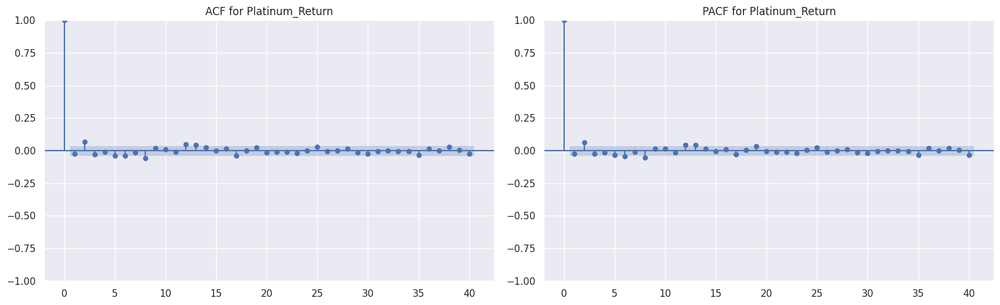

In [25]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

# Defining the return columns to analyze
return_cols = ['Gold_Return', 'Silver_Return', 'Platinum_Return']

for col in return_cols:
    if col in df.columns:
        fig, axes = plt.subplots(1, 2, figsize=(16, 5))

        # Plotting ACF
        plot_acf(df[col].dropna(), lags=40, ax=axes[0])
        axes[0].set_title(f'ACF for {col}')

        # Plotting PACF
        plot_pacf(df[col].dropna(), lags=40, ax=axes[1])
        axes[1].set_title(f'PACF for {col}')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Warning: Column '{col}' not found in DataFrame.")

## Rolling Statistics Analysis



--- Calculating Rolling Statistics for Gold_Price ---


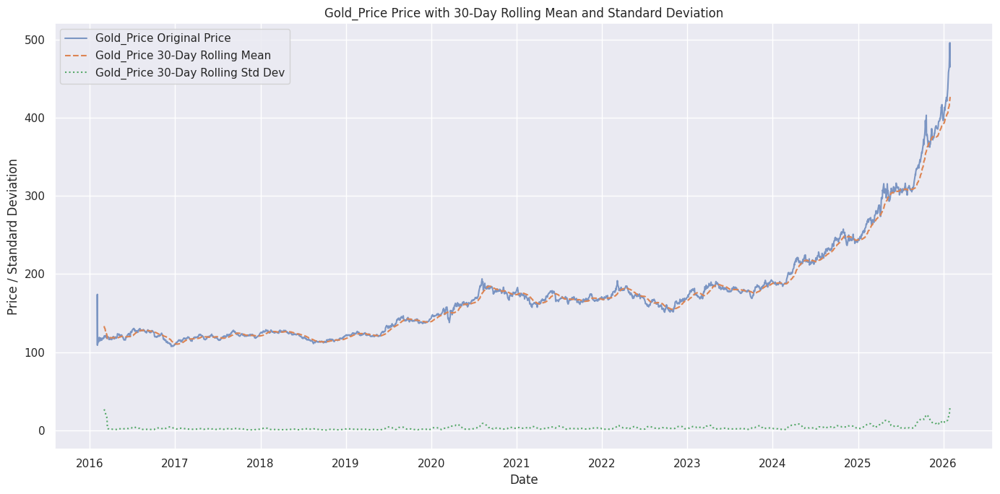


--- Calculating Rolling Statistics for Silver_Price ---


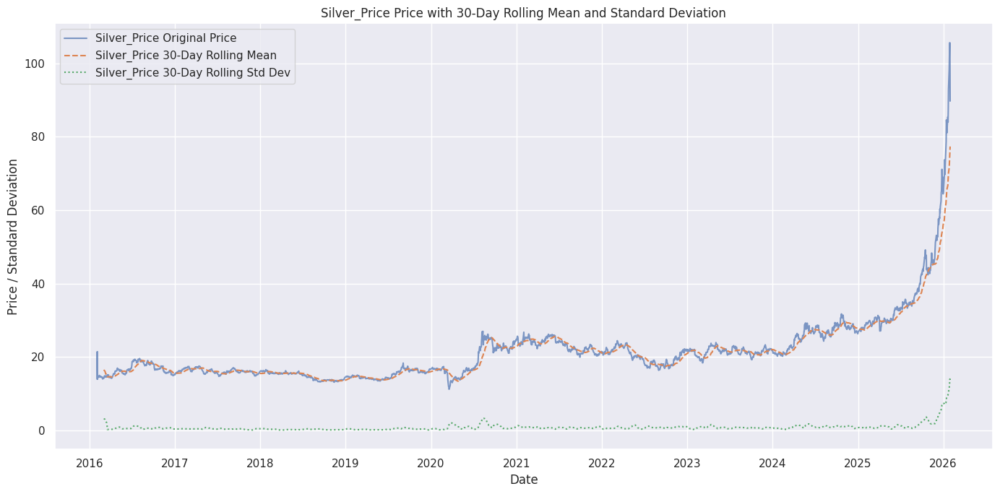


--- Calculating Rolling Statistics for Platinum_Price ---


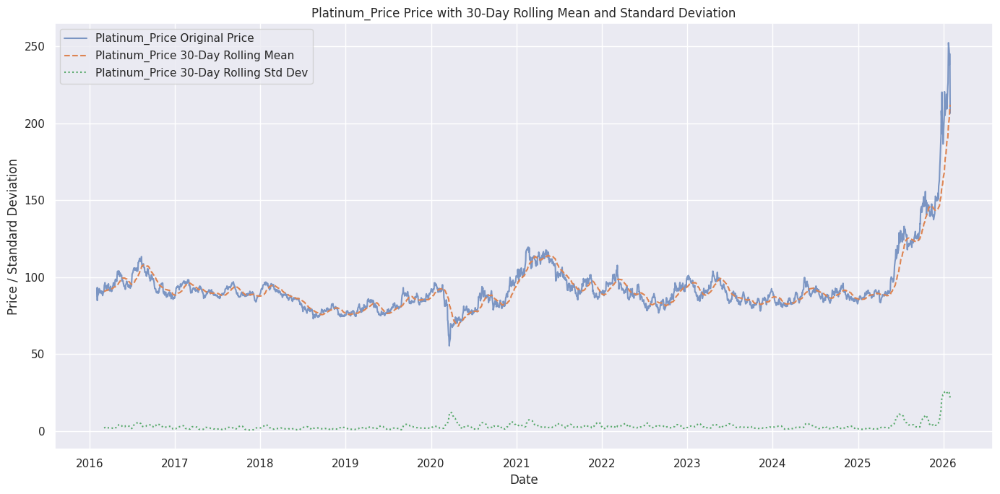

Rolling mean and standard deviation calculated and visualized for all specified metals.


In [26]:
import matplotlib.pyplot as plt

price_cols = ['Gold_Price', 'Silver_Price', 'Platinum_Price']
window_size = 30

for col in price_cols:
    print(f"\n--- Calculating Rolling Statistics for {col} ---")

    # Calculating rolling mean
    df[f'{col}_rolling_mean_{window_size}'] = df[col].rolling(window=window_size).mean()

    # Calculating rolling standard deviation
    df[f'{col}_rolling_std_{window_size}'] = df[col].rolling(window=window_size).std()

    # Plotting the original price, rolling mean, and rolling standard deviation
    plt.figure(figsize=(14, 7))
    plt.plot(df.index, df[col], label=f'{col} Original Price', alpha=0.7)
    plt.plot(df.index, df[f'{col}_rolling_mean_{window_size}'], label=f'{col} {window_size}-Day Rolling Mean', linestyle='--')
    plt.plot(df.index, df[f'{col}_rolling_std_{window_size}'], label=f'{col} {window_size}-Day Rolling Std Dev', linestyle=':')

    plt.title(f'{col} Price with {window_size}-Day Rolling Mean and Standard Deviation')
    plt.xlabel('Date')
    plt.ylabel('Price / Standard Deviation')
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

print("Rolling mean and standard deviation calculated and visualized for all specified metals.")

# Pairplot

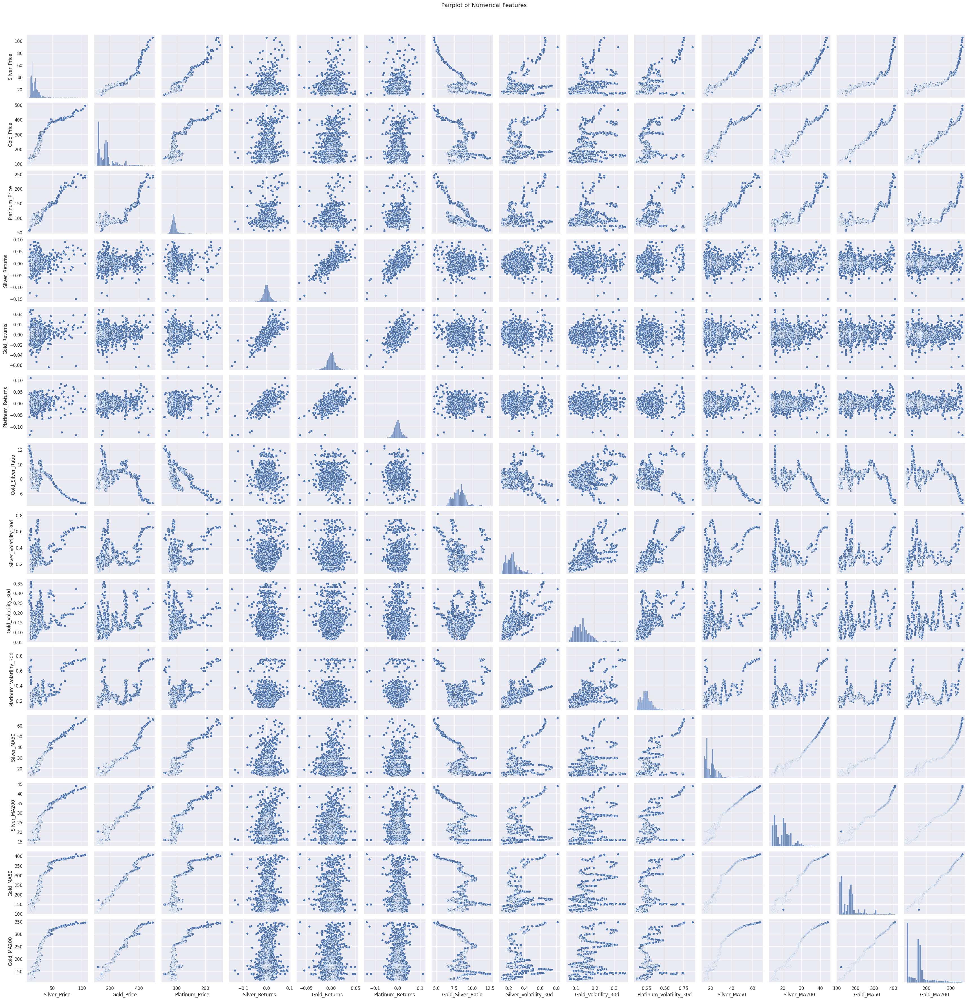

In [17]:
sns.pairplot(df.select_dtypes(include = np.number))
plt.suptitle('Pairplot of Numerical Features', y=1.02)
plt.show()

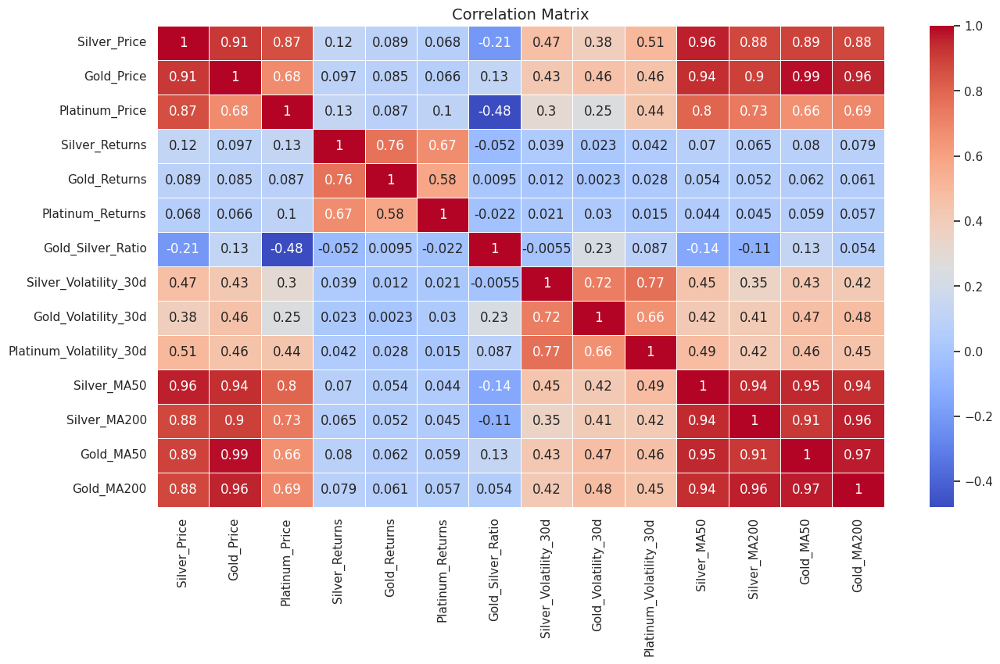

In [18]:
plt.figure(figsize=(15, 8))
sns.heatmap(df.corr(numeric_only = True), annot=True, cmap="coolwarm", linewidths=0.5)
plt.title("Correlation Matrix", fontsize=14)
plt.show()

# Feature Engineering

--- 1. CREATING THE TRADER'S SIGNALS ---
✅ Created 'Gold_Silver_Ratio' (Strategic Indicator).
✅ Created Returns and Volatility metrics.

--- 2. CORRELATION HEATMAP (SAFE HAVENS VS. INDUSTRY) ---


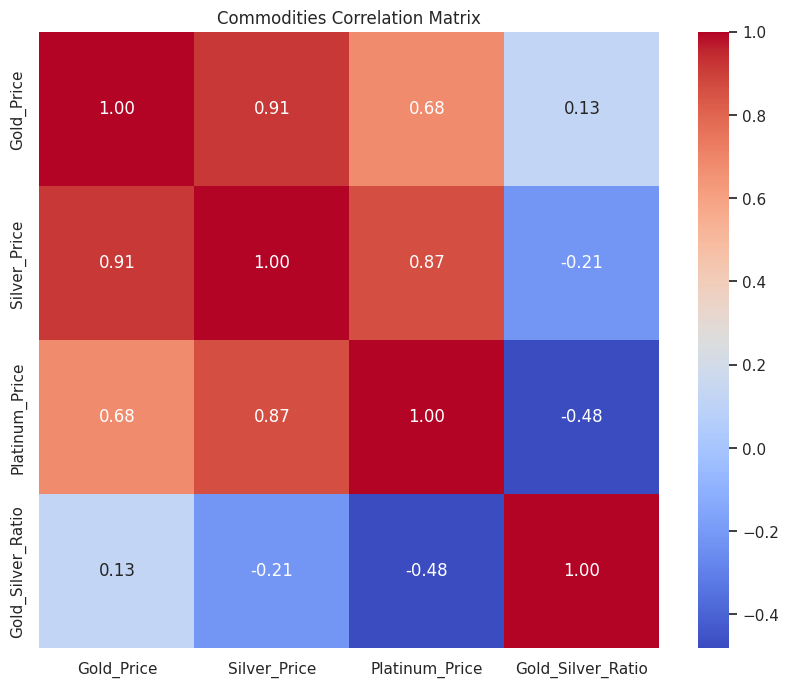

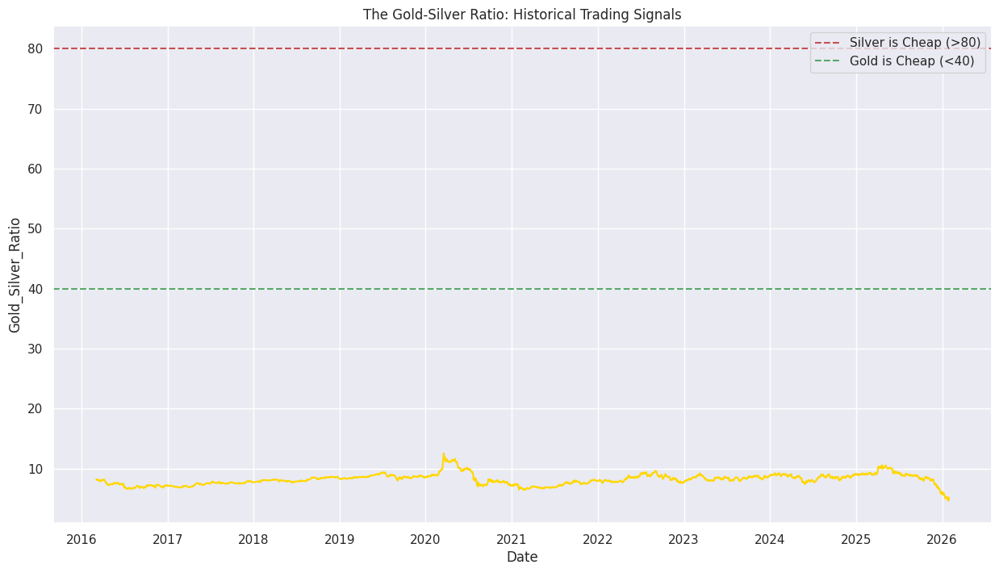

In [21]:
print("--- 1. CREATING THE TRADER'S SIGNALS ---")

if 'Date' in df.columns:
    df['Date'] = pd.to_datetime(df['Date'])
    df = df.sort_values('Date')
else:
    print("⚠️ No Date column found. Assuming data is already sorted by time.")

# 1. The Gold-Silver Ratio (GSR)
try:
    df['Gold_Silver_Ratio'] = df['Gold_Price'] / df['Silver_Price']
    print("✅ Created 'Gold_Silver_Ratio' (Strategic Indicator).")
except KeyError:
    print("⚠️ Column names mismatch. Please ensure 'Gold_Price' and 'Silver_Price' exist.")

# 2. Daily Returns (Profit/Loss %)
# Investors care about growth, not just price.
metals_price_cols = ['Gold_Price', 'Silver_Price', 'Platinum_Price']
for metal_col in metals_price_cols:
    # Extract base metal name (e.g., 'Gold' from 'Gold_Price') for naming new columns
    base_metal_name = metal_col.replace('_Price', '')
    if metal_col in df.columns:
        df[f'{base_metal_name}_Return'] = df[metal_col].pct_change() * 100
        # 3. Volatility (Risk) - Rolling 30-day Standard Deviation
        df[f'{base_metal_name}_Volatility'] = df[f'{base_metal_name}_Return'].rolling(30).std()

print("✅ Created Returns and Volatility metrics.")
df_clean = df.dropna()


print("\n--- 2. CORRELATION HEATMAP (SAFE HAVENS VS. INDUSTRY) ---")
cols_to_check = ['Gold_Price', 'Silver_Price', 'Platinum_Price', 'Gold_Silver_Ratio']

# Filter cols_to_check to only include columns actually present in df_clean
existing_cols_to_check = [col for col in cols_to_check if col in df_clean.columns]

if len(existing_cols_to_check) > 1: # Need at least two columns for correlation
    corr_matrix = df_clean[existing_cols_to_check].corr()

    plt.figure(figsize=(10, 8))
    sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt=".2f")
    plt.title('Commodities Correlation Matrix')
    plt.show()
else:
    print(f"⚠️ Not enough columns to create a correlation matrix. Available: {existing_cols_to_check}")

# Visualizing the Gold/Silver Ratio over time
plt.figure(figsize=(15, 8))
sns.lineplot(data=df_clean, x='Date' if 'Date' in df.columns else df_clean.index, y='Gold_Silver_Ratio', color='gold')
plt.axhline(y=80, color='r', linestyle='--', label='Silver is Cheap (>80)')
plt.axhline(y=40, color='g', linestyle='--', label='Gold is Cheap (<40)')
plt.title('The Gold-Silver Ratio: Historical Trading Signals')
plt.legend()
plt.show()

# Machine Learning

--- 1. FEATURE ENGINEERING FOR RETURNS ---
✅ Target set to: Gold_Return

--- 2. TRAINING THE AI (RANDOM FOREST) ---
✅ Model Trained.

--- 3. EVALUATING PERFORMANCE ---
💰 MAE (Return): 0.01046 (Average error in daily % change)
🎯 R-Squared: -7.16%


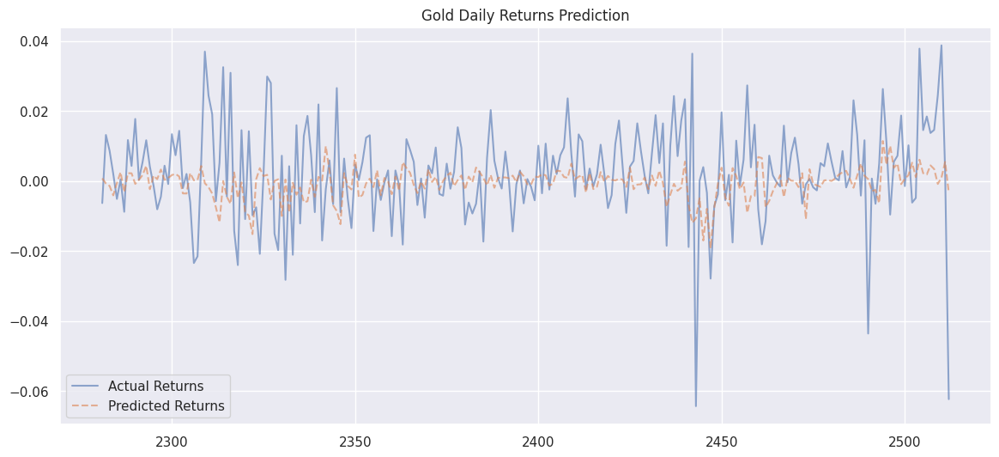

<Axes: title={'center': 'Feature Importance'}>

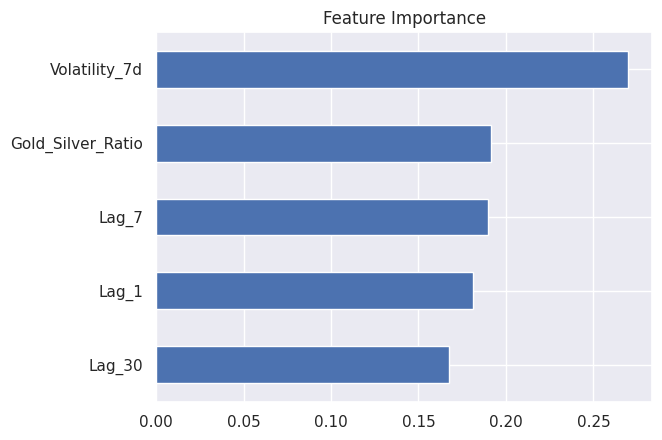

In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, r2_score

print("--- 1. FEATURE ENGINEERING FOR RETURNS ---")

target_col = 'Gold_Return'

df_ml = df.copy()

if 'Date' in df_ml.columns:
    df_ml['Date'] = pd.to_datetime(df_ml['Date'])
    df_ml = df_ml.sort_values('Date')

# Calculating Target if not present
if target_col not in df_ml.columns:
    df_ml[target_col] = df_ml['Gold_Price'].pct_change()

# Features: Lags of Returns (not Prices)
df_ml['Lag_1'] = df_ml[target_col].shift(1)
df_ml['Lag_7'] = df_ml[target_col].shift(7)
df_ml['Lag_30'] = df_ml[target_col].shift(30)

# Features: Rolling Volatility
df_ml['Volatility_7d'] = df_ml[target_col].rolling(window=7).std()

# Inter-market: Gold/Silver Ratio
if 'Silver_Price' in df_ml.columns:
    df_ml['Gold_Silver_Ratio'] = df_ml['Gold_Price'] / df_ml['Silver_Price']

# Dropping NaNs
df_ml = df_ml.dropna()

print(f"✅ Target set to: {target_col}")

print("\n--- 2. TRAINING THE AI (RANDOM FOREST) ---")

features = ['Lag_1', 'Lag_7', 'Lag_30', 'Volatility_7d', 'Gold_Silver_Ratio']
X = df_ml[features]
y = df_ml[target_col]

# Time-Series Split
train_size = int(len(X) * 0.90)
X_train, X_test = X.iloc[:train_size], X.iloc[train_size:]
y_train, y_test = y.iloc[:train_size], y.iloc[train_size:]

model = RandomForestRegressor(n_estimators=100, random_state=42)
model.fit(X_train, y_train)
print("✅ Model Trained.")

print("\n--- 3. EVALUATING PERFORMANCE ---")
predictions = model.predict(X_test)

# Metrics
mae = mean_absolute_error(y_test, predictions)
r2 = r2_score(y_test, predictions)

print(f"💰 MAE (Return): {mae:.5f} (Average error in daily % change)")
print(f"🎯 R-Squared: {r2*100:.2f}%")

# Visualization
plt.figure(figsize=(14, 6))
plt.plot(y_test.index, y_test.values, label='Actual Returns', alpha=0.6)
plt.plot(y_test.index, predictions, label='Predicted Returns', alpha=0.6, linestyle='--')
plt.title("Gold Daily Returns Prediction")
plt.legend()
plt.show()

# Feature Importance
pd.Series(model.feature_importances_, index=features).sort_values().plot(kind='barh', title='Feature Importance')

# Thank You